# Итоговый проект по курсу OTUS "ML для финансового анализа" 2024-07

### 1. Задача - провести анализ исторических данных котировок криптовалют (на примере ETH) с использованием инструментов машинного обучения и нейронных сетей для предсказания торговых действий на бирже (покупка, продажа)

### 2. Сбор и очистка данных

In [14]:
from utils.config import COMMON_CONFIG

!pip install matplotlib -q

import warnings
warnings.filterwarnings("ignore")

!pip install pandas -q
import pandas as pd
# Хак чтобы работало на Anaconda под MacOs 10.15.7 Catalina
pd.DataFrame.iteritems = pd.DataFrame.items

!pip install plotly -q

from utils.plots import linear_plot

In [15]:
#!pip install git+https://github.com/kernc/backtesting.py.git -q
!pip install backtesting -q

from backtesting import Strategy
from backtesting.lib import crossover
from backtesting.test import SMA
from utils.backtest import convert_data_to_bt_format, run_backtest

In [16]:
import numpy as np
import os
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

import random

def seed_everything(seed: int = COMMON_CONFIG.SEED) -> None:
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    print(f"Using {seed} seed")

# Зафиксируем SEED
seed_everything(COMMON_CONFIG.SEED)

Using 777 seed


#### Загрузим данные

In [17]:
from utils.files import read_data_from_file
from utils.data import train_test_split, train_test_split_by_date

df = read_data_from_file(COMMON_CONFIG.DATA_PATH, COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [18]:
linear_plot(x=df.index, y=df['close'], title = 'ETH/USDT')

In [19]:
#Сформируем данные для бэктестинга
df_for_bt = df.copy()
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [20]:
!pip install summarytools -q

from summarytools import dfSummary

dfSummary(df)

No,Variable,Stats / Values,Freqs / (% of Valid),Graph,Missing
1,open[float64],Mean (sd) : 2000.2 (1150.9)min < med < max:96.5 < 1878.3 < 4846.9IQR (CV) : 1677.4 (1.7),"40,382 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACu0lEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0xlO8QjOesd35fBYQu3f3HgBwi4d7DyAU51xTUsPjJ3bn8/mlrPHATyVDdc41e73elzRNu0V/Y7VaZc65r8Qah0qGKqmRpml3PB6/dDqdbd6Ll8tlMplMuvP5vCGJUCNQ1VAlSZ1OZ9vv938UvLxZ6mDghcUUTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDCBUGECocKEN09PeR5A5vAxSvHPUH0PIHP4GGV56x+18AFkDh+jTDcdnPY4gMzhY5SCxRRMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYUKlv+ZnER8g/jtCjQgfIL6OUOPCB4ivINQI8QHiP7GYggn8o15xPB7rklLnXJHLK7mguaeoQ/VYAaen06le9L6bzaa+3+8/DYfDWq1Wyz1XXCwWa+fcN0l5r/Uad5VFG6rPCni/3yfH4/Hjdrv9Lin3XG+32z0kSdIajUbbwWCQ5bl2Op2+f3x8/DwcDj/kjdx33FUWbajyWAE/Pz93n56eWofDoeYzgHa7nXtRk2VZs2jkZY27imIOVVKxFXCWZXdf+RaNPNR4rGPVDxMIFSYQKkyIfo6KfKr6/JdQK8T3+W/MB1oItUJ8nv/GfqCFUCuoyKOxX6J9PMZiCiYQKkwgVJhAqDCBUGECocIEQoUJPEfFK8/tVyngFiyhQpL/9qsUdguWUCHJb/tVCr8FS6j4jcf2qxRwCzZoqJ5zHt7IxKtgofrOeXgjE5eCheo75+GNTFwKPkctOufhjUx7Qr5dwGIKpQj9dgGhohSh3y64KdTlcpnkubEkrdfrRJI2m00ym81a//N6q/e2Ou7L60P5CYmurAL/qp3hAAAAAElFTkSuQmCC"">",0(0.0%)
2,high[float64],Mean (sd) : 2011.0 (1157.1)min < med < max:105.7 < 1886.0 < 4868.0IQR (CV) : 1687.0 (1.7),"38,370 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACsklEQVR4nO3cQY7aMBSA4ecyoABSEKKCHReo1AVLDtHD9ghF4gTcgB1ShIJIJyKEdFONqDp0SBw3ftb/7TPx4lfGxk5MVVUC+O5T1wMAnvHS9QBcMcYMRWRg8ScuVVW9tjUe2AkyVGPMcDabfYvjeNr0b5xOp6Mx5jux+iHIUEVkEMfxdL1ev04mk7zuxWmaRtvtdpokyUBECNUDoYYqIiKTySSfz+c/G14+bHUwsMJiCioQKlQgVKhAqFCBUKECoUIFQoUKhAoVCBUqECpUIFSoQKhQgVChwoenpywPIHP4GK34Z6i2B5A5fIy2fPREbXwAmcPHaNNTB6ctDiBz+BitYDEFFQgVKhAqVCBUqECoUIFQoQKhQgVChQqEChUIFSoQKlQgVKgQ9Nf8NOIDxO8jVI/wAeLHCNUvfID4AUL1EB8g/huhPlCWZV9EYmNMk8uDnCd2iVDfkWVZvyiKr8vlstfr9Wr/Cw51ntglr0O1WAHHt9ut3/S+l8vlJYqi0Wq1yheLxbHOtWmaRpvNZp4kyWdjzKnmra3GHTJvQ7VZARdFEZVl+SXP8x8i0nSuJ+PxuPZc0eZp3Na4Q+RtqGKxAt7v99Pdbje6Xq89V4N7xOZp3OW4fedzqCLSbAV8PB47X/k2eRr7MG5fsYUKFQgVKhAqVPB+jop6Qt2oINSAhLxRQagBsd2o8PlAC6EGqMlPY795+/MYiymoQKhQgVChAqFCBUKFCoQKFQgVKvA7Kt5Ybr+KONyCJVSIiP32q4jbLVhChYjYbb+KuN+CJVT8wWL7VcThFqzTUC3nPLyRiTfOQrWd8/BGJu45C9V2zsMbmbjnfI7adM7DG5n6uHy7gMUUWuH67QJCRStcv13wVKhpmkZ1biwicj6fIxGRLMuiw+Ew+p/Xa7231nHfX+/KL83DuLcY1QQQAAAAAElFTkSuQmCC"">",0(0.0%)
3,low[float64],Mean (sd) : 1988.5 (1144.2)min < med < max:86.0 < 1872.0 < 4833.2IQR (CV) : 1669.4 (1.7),"38,677 distinct values","<img src = ""data:image/png;base64, iVBORw0KGgoAAAANSUhEUgAAAKoAAABGCAYAAABc8A97AAAAOXRFWHRTb2Z0d2FyZQBNYXRwbG90bGliIHZlcnNpb24zLjcuNSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy/xnp5ZAAAACXBIWXMAAA9hAAAPYQGoP6dpAAACu0lEQVR4nO3cP47aQBiH4d+EBRlQjBARdFwgUgpKmtwgh02bLgV7gb3BNggJGRBkEX/TRCuihCz2eMJ81vv0xlO8QjOesd35fBYQu3f3HgBwi4d7DyAU51xTUsPjJ3bn8/mlrPHATyVDdc41e73elzRNu0V/Y7VaZc65r8Qah0qGKqmRpml3PB6/dDqdbd6Ll8tlMplMuvP5vCGJUCNQ1VAlSZ1OZ9vv938UvLxZ6mDghcUUTCBUmECoMIFQYQKhwgRChQmEChMIFSYQKkwgVJhAqDCBUGECocKEN09PeR5A5vAxSvHPUH0PIHP4GGV56x+18AFkDh+jTDcdnPY4gMzhY5SCxRRMIFSYQKgwgVBhAqHCBEKFCYQKEwgVJhAqTCBUmECoMIFQYUKlv+ZnER8g/jtCjQgfIL6OUOPCB4ivINQI8QHiP7GYggn8o15xPB7rklLnXJHLK7mguaeoQ/VYAaen06le9L6bzaa+3+8/DYfDWq1Wyz1XXCwWa+fcN0l5r/Uad5VFG6rPCni/3yfH4/Hjdrv9Lin3XG+32z0kSdIajUbbwWCQ5bl2Op2+f3x8/DwcDj/kjdx33FUWbajyWAE/Pz93n56eWofDoeYzgHa7nXtRk2VZs2jkZY27imIOVVKxFXCWZXdf+RaNPNR4rGPVDxMIFSYQKkyIfo6KfKr6/JdQK8T3+W/MB1oItUJ8nv/GfqCFUCuoyKOxX6J9PMZiCiYQKkwgVJhAqDCBUGECocIEQoUJPEfFK8/tVyngFiyhQpL/9qsUdguWUCHJb/tVCr8FS6j4jcf2qxRwCzZoqJ5zHt7IxKtgofrOeXgjE5eCheo75+GNTFwKPkctOufhjUx7Qr5dwGIKpQj9dgGhohSh3y64KdTlcpnkubEkrdfrRJI2m00ym81a//N6q/e2Ou7L60P5CYmurAL/qp3hAAAAAElFTkSuQmCC"">",0(0.0%)
4,close[float64],Mean (sd)

In [21]:
df.isnull().sum()

open      0
high      0
low       0
close     0
volume    0
dtype: int64

In [22]:
df.describe()

,open,high,low,close,volume
count,44435.000000,44435.000000,44435.000000,44435.000000,44435.000000
mean,2000.152766,2011.040867,1988.490069,2000.224220,26816.846488
std,1150.946621,1157.123572,1144.233627,1150.930255,29147.269025
min,96.510000,105.690000,86.000000,96.620000,161.748770
25%,1262.090000,1267.150000,1253.690000,1262.170000,10124.839750
50%,1878.300000,1886.000000,1872.030000,1878.300000,18141.649700
75%,2939.510000,2954.150000,2923.125000,2939.790000,32639.868675
max,4846.940000,4868.000000,4833.190000,4846.710000,493227.882820


#### Посмотрим на базовое поведение модели на основе самой простой стратегии скользящих средних

In [23]:
class SmaCross(Strategy):
    n1 = 50
    n2 = 200
    
    def init(self):
        self.sma1 = self.I(SMA, self.data.Close, self.n1)
        self.sma2 = self.I(SMA, self.data.Close, self.n2)
    
    def next(self):
        if crossover(self.sma1, self.sma2):
            self.position.close()
            self.buy()

        elif crossover(self.sma2, self.sma1):
            self.position.close()
            self.sell()

In [24]:
bt_data = convert_data_to_bt_format(df_for_bt.reset_index())
_, bt_test_data = train_test_split(bt_data)
bt_test_data

Train size: 35650, Test size: 8785


,Open,High,Low,Close,Volume
Datetime,,,,,
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758
2024-01-27 00:00:00,2267.67,2280.31,2265.23,2280.18,12034.2632
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.0488


In [25]:
linear_plot(x = bt_test_data.index, y = bt_test_data['Close'], title = 'ETH/USDT backtest data')

In [26]:
_ = run_backtest(bt_test_data, SmaCross)

Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   97.245304
Equity Final [$]                  737185.3807
Equity Peak [$]                 1832442.44282
Return [%]                         -26.281462
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                  -26.158864
Volatility (Ann.) [%]               50.618671
Sharpe Ratio                        -0.516783
Sortino Ratio                       -0.620525
Calmar Ratio                        -0.424031
Max. Drawdown [%]                  -61.690983
Avg. Drawdown [%]                    -2.46666
Max. Drawdown Duration      312 days 15:00:00
Avg. Drawdown Duration        5 days 07:00:00
# Trades                                   56
Win Rate [%]                        30.357143
Best Trade [%]                      60.339059
Worst Trade [%]                    -12.524925
Avg. Trade [%]                    

### 3. Технический анализ

In [28]:
!pip install pandas_ta -q

from utils.ta import enrich_with_ta, get_trade_signals, get_best_params

In [29]:
class TechAnalysisStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]

        if current_signal == 1:
            self.position.close()
            self.buy()

        elif current_signal == -1:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [30]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), {
    'RSI_period': 14,
    'fastMACD_period': 12,
    'slowMACD_period': 26,
    'signalMACD_period': 9
})
data_with_ta_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_ta_signals)
_, bt_test_data = train_test_split(bt_data)
_ = run_backtest(bt_test_data, TechAnalysisStrategy)

Train size: 35650, Test size: 8785


Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   81.696073
Equity Final [$]                   774799.303
Equity Peak [$]                 1423793.85566
Return [%]                          -22.52007
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                  -22.412261
Volatility (Ann.) [%]                59.12497
Sharpe Ratio                        -0.379066
Sortino Ratio                       -0.488253
Calmar Ratio                        -0.363709
Max. Drawdown [%]                  -61.621378
Avg. Drawdown [%]                   -4.655837
Max. Drawdown Duration      250 days 17:00:00
Avg. Drawdown Duration       12 days 11:00:00
# Trades                                   31
Win Rate [%]                        38.709677
Best Trade [%]                      26.142154
Worst Trade [%]                     -20.37895
Avg. Trade [%]                    

In [31]:
best_ta_params = get_best_params(df_for_bt.reset_index(), TechAnalysisStrategy, COMMON_CONFIG.TA_MAX_STAT)

Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 4}
Получен результат 0.9752227518561347
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 7}
Получен результат 1.0812660588674965
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 19, 'signalMACD_period': 9}
Получен результат 1.1238106663438394
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 4}
Получен результат 1.1690137771570082
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 7}
Получен результат 1.2906880976073645
Выполняем backtesting для параметров {'RSI_period': 14, 'fastMACD_period': 6, 'slowMACD_period': 26, 'signalMACD_period': 9}
Получен результат 1.3012261469571063
Выполняем backtesting для па

In [32]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_ta_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_ta_signals)
_, bt_best_params_test_data = train_test_split(bt_data)
_ = run_backtest(bt_best_params_test_data, TechAnalysisStrategy)

Train size: 35650, Test size: 8785


Start                     2024-01-26 20:00:00
End                       2025-01-26 20:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   86.659078
Equity Final [$]                1154838.65914
Equity Peak [$]                 1418872.02964
Return [%]                          15.483866
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                   15.393301
Volatility (Ann.) [%]               79.633683
Sharpe Ratio                         0.193301
Sortino Ratio                        0.379533
Calmar Ratio                         0.361856
Max. Drawdown [%]                  -42.539863
Avg. Drawdown [%]                   -7.072299
Max. Drawdown Duration      193 days 23:00:00
Avg. Drawdown Duration       14 days 10:00:00
# Trades                                   21
Win Rate [%]                        38.095238
Best Trade [%]                      46.273118
Worst Trade [%]                    -14.666397
Avg. Trade [%]                    

In [33]:
bt_best_params_test_data_to_save = bt_best_params_test_data.copy()
bt_best_params_test_data_to_save.index.name = 'Datetime'
bt_best_params_test_data_to_save.to_csv(COMMON_CONFIG.BT_BEST_PARAMS_TA_TEST_DATA_FILE)

### 4. Машинное обучение

In [34]:
!pip install scikit-learn -q

import numpy as np

# Функция для добавления целевой переменной (таргета)
def add_target(_df):
    _df['close_next_period'] = _df['close'].shift(COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET)
    _df['target'] = (_df['close_next_period'] > _df['close']).astype(int)
    _df = _df.dropna(subset=['close_next_period', 'target'])
    return _df

#### Обучение моделей будем производить, добавив доп признаки тех анализа

In [35]:
ta_data, ta_columns = enrich_with_ta(df.reset_index(), best_ta_params)
ta_data

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI
0,2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336,NaN,NaN,NaN,NaN
1,2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516,NaN,NaN,NaN,NaN
2,2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623,NaN,NaN,NaN,NaN
3,2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433,NaN,NaN,NaN,NaN
4,2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701
44433,2025-01-26 19:00:00,3337.17,3341.95,3329.62,3338.74,7563.72820,1.052454,-0.492341,1.544795,57.430036


In [36]:
def create_trend_features(df, features, lag_periods):
    """
    Добавляет классические финансовые признаки: отношение к предыдущим периодам, логарифмические изменения и индикаторы трендов.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить индикаторы
    lag_periods: сколько периодов назад учитывать для расчетов
    
    Возвращает:
    - обновленный DataFrame с новыми фичами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    for feature in features:
        # Отношение текущего значения к предыдущему (лаг = 1)
        df[f'{feature}_ratio_1'] = df[feature] / df[feature].shift(1)
        new_columns.append(f'{feature}_ratio_1')
        
        # Логарифмическое изменение (логарифм отношения текущего значения к предыдущему)
        df[f'{feature}_log_diff_1'] = np.log(df[feature] / df[feature].shift(1))
        new_columns.append(f'{feature}_log_diff_1')
        
        # Momentum (разница между текущим значением и значением N периодов назад)
        df[f'{feature}_momentum_{lag_periods}'] = df[feature] - df[feature].shift(lag_periods)
        new_columns.append(f'{feature}_momentum_{lag_periods}')
        
        # Rate of Change (ROC): процентное изменение за N периодов
        df[f'{feature}_roc_{lag_periods}'] = (df[feature] - df[feature].shift(lag_periods)) / df[feature].shift(lag_periods) * 100
        new_columns.append(f'{feature}_roc_{lag_periods}')
        
        # Exponential Moving Average (EMA) с периодом N
        df[f'{feature}_ema_{lag_periods}'] = df[feature].ewm(span=lag_periods, adjust=False).mean()
        new_columns.append(f'{feature}_ema_{lag_periods}')
    
    # Удаление строк с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [37]:
def create_lag_features(df, features, lag_periods):
    """
    Добавляет лаги для указанных признаков на указанное количество периодов назад.
    
    df: DataFrame с исходными данными
    features: список признаков, для которых необходимо добавить лаги
    lag_periods: сколько лагов назад необходимо создать
    Возвращает: 
    - обновленный DataFrame с лагами
    - список новых колонок, которые можно использовать как признаки
    """
    df = df.copy()  # Работаем с копией DataFrame
    new_columns = []  # Список для хранения новых колонок
    
    # Для каждого признака создаем лаги
    for feature in features:
        for lag in range(1, lag_periods + 1):
            new_col_name = f'{feature}_lag_{lag}'
            df[new_col_name] = df[feature].shift(lag)
            new_columns.append(new_col_name)
    
    # Удаляем строки с NaN значениями, которые появились из-за сдвигов
    df = df.dropna()
    
    return df, new_columns

In [38]:
# Добавляем целевую переменную (таргет)
ta_data_with_target = add_target(ta_data)

# Параметры для создания трендовых признаков
lag_periods = 3  # Например, 3 периода назад
#features_to_trend = ['open', 'high', 'low', 'close', 'volume']
features_to_trend = ['close']
features_to_lag = ['close']

# Создаем трендовые признаки
ta_data_with_target_and_trend, new_trend_features = create_trend_features(ta_data_with_target, features_to_trend, lag_periods)

ta_data_with_target_and_trend

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI,close_next_period,target,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3
46,2020-01-02 22:00:00,127.72,127.76,127.24,127.39,2654.51024,-1.247498,-1.003764,-0.243734,34.767283,127.19,0,0.997416,-0.002587,-0.23,-0.180223,127.479789
47,2020-01-02 23:00:00,127.39,127.48,126.91,127.19,2980.68108,-1.280220,-1.059055,-0.221164,33.500954,127.07,0,0.998430,-0.001571,0.03,0.023592,127.334894
48,2020-01-03 00:00:00,127.19,127.60,126.82,127.07,7303.34389,-1.308625,-1.108969,-0.199656,32.730643,126.04,0,0.999057,-0.000944,-0.65,-0.508926,127.202447
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,-1.409122,-1.169000,-0.240122,26.993357,126.92,1,0.991894,-0.008139,-1.35,-1.059738,126.621224
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,-1.409136,-1.217027,-0.192109,37.132641,126.89,0,1.006982,0.006958,-0.27,-0.212281,126.770612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44429,2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720,-3.436288,-0.207833,-3.228455,46.617220,3315.82,1,1.001275,0.001274,7.54,0.227948,3312.642318
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013,3338.04,1,1.000154,0.000154,7.98,0.241245,3314.231159
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587,3337.16,0,1.006701,0.006679,26.95,0.813931,3326.135579
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701,3338.74,1,0.999736,-0.000264,21.85,0.659064,3331.647790


In [39]:
# Создаем лаги в данных
ta_data_with_target_and_trend_and_lags, lags_columns = create_lag_features(ta_data_with_target_and_trend, features_to_lag, lag_periods)
ta_data_with_target_and_trend_and_lags

,date,open,high,low,close,volume,macd,macd_signal,macd_hist,RSI,close_next_period,target,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,close_lag_1,close_lag_2,close_lag_3
49,2020-01-03 01:00:00,127.07,127.17,125.88,126.04,12202.68649,-1.409122,-1.169000,-0.240122,26.993357,126.92,1,0.991894,-0.008139,-1.35,-1.059738,126.621224,127.07,127.19,127.39
50,2020-01-03 02:00:00,126.04,127.08,125.90,126.92,14356.43191,-1.409136,-1.217027,-0.192109,37.132641,126.89,0,1.006982,0.006958,-0.27,-0.212281,126.770612,126.04,127.07,127.19
51,2020-01-03 03:00:00,126.94,127.11,126.65,126.89,6279.76820,-1.402254,-1.254073,-0.148182,36.944270,129.30,1,0.999764,-0.000236,-0.18,-0.141654,126.830306,126.92,126.04,127.07
52,2020-01-03 04:00:00,126.89,130.15,126.83,129.30,47219.15382,-1.186406,-1.240539,0.054133,56.177033,129.21,0,1.018993,0.018815,3.26,2.586480,128.065153,126.89,126.92,126.04
53,2020-01-03 05:00:00,129.23,129.97,128.76,129.21,13556.58641,-1.008282,-1.194088,0.185806,55.496277,129.17,0,0.999304,-0.000696,2.29,1.804286,128.637576,129.30,126.89,126.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44429,2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720,-3.436288,-0.207833,-3.228455,46.617220,3315.82,1,1.001275,0.001274,7.54,0.227948,3312.642318,3311.09,3307.84,3307.77
44430,2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040,-3.508672,-0.868001,-2.640672,46.892013,3338.04,1,1.000154,0.000154,7.98,0.241245,3314.231159,3315.31,3311.09,3307.84
44431,2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360,-1.693211,-1.033043,-0.660168,57.223587,3337.16,0,1.006701,0.006679,26.95,0.813931,3326.135579,3315.82,3315.31,3311.09
44432,2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880,-0.260526,-0.878539,0.618013,56.752701,3338.74,1,0.999736,-0.000264,21.85,0.659064,3331.647790,3338.04,3315.82,3315.31


In [40]:
ml_columns = new_trend_features + lags_columns #+ ta_columns + # + features_to_trend
ml_columns

['close_ratio_1',
 'close_log_diff_1',
 'close_momentum_3',
 'close_roc_3',
 'close_ema_3',
 'close_lag_1',
 'close_lag_2',
 'close_lag_3']

In [41]:
data = ta_data_with_target_and_trend_and_lags[ml_columns + ['target', 'date']]
data

,close_ratio_1,close_log_diff_1,close_momentum_3,close_roc_3,close_ema_3,close_lag_1,close_lag_2,close_lag_3,target,date
49,0.991894,-0.008139,-1.35,-1.059738,126.621224,127.07,127.19,127.39,1,2020-01-03 01:00:00
50,1.006982,0.006958,-0.27,-0.212281,126.770612,126.04,127.07,127.19,0,2020-01-03 02:00:00
51,0.999764,-0.000236,-0.18,-0.141654,126.830306,126.92,126.04,127.07,1,2020-01-03 03:00:00
52,1.018993,0.018815,3.26,2.586480,128.065153,126.89,126.92,126.04,0,2020-01-03 04:00:00
53,0.999304,-0.000696,2.29,1.804286,128.637576,129.30,126.89,126.92,0,2020-01-03 05:00:00
...,...,...,...,...,...,...,...,...,...,...
44429,1.001275,0.001274,7.54,0.227948,3312.642318,3311.09,3307.84,3307.77,1,2025-01-26 15:00:00
44430,1.000154,0.000154,7.98,0.241245,3314.231159,3315.31,3311.09,3307.84,1,2025-01-26 16:00:00
44431,1.006701,0.006679,26.95,0.813931,3326.135579,3315.82,3315.31,3311.09,0,2025-01-26 17:00:00
44432,0.999736,-0.000264,21.85,0.659064,3331.647790,3338.04,3315.82,3315.31,1,2025-01-26 18:00:00


In [42]:
train_data, val_data, test_data = train_test_split_by_date(data)

Train size: 31184, Val size: 4416, Test size: 8785


In [43]:
# Разделение на признаки (X) и целевую переменную (y) для каждой выборки
X_train = train_data[ml_columns]
y_train = train_data['target']

X_val = train_data[ml_columns]
y_val = train_data['target']

X_test = test_data[ml_columns]
y_test = test_data['target']

#### Определим метрики качества моделей

In [44]:
from sklearn.metrics import roc_auc_score, precision_score, recall_score, accuracy_score, f1_score

def calculate_metrics_table(y_true, y_pred_prob, thresholds=[0.5, 0.6, 0.7, 0.8]):
    metrics_table = []
    
    for threshold in thresholds:
        y_pred = (y_pred_prob >= threshold).astype(int)
        metrics = {
            'Cutoff': threshold,
            'Precision': precision_score(y_true, y_pred),
            'Recall': recall_score(y_true, y_pred),
            'Accuracy': accuracy_score(y_true, y_pred),
            'F1-Score': f1_score(y_true, y_pred)
        }
        metrics_table.append(metrics)
    
    # Преобразуем список словарей в DataFrame для удобного вывода
    return pd.DataFrame(metrics_table)*100

In [45]:
# Выводим ROC AUC и метрики для всех выборок
def display_metrics_set(name, y_true, y_pred_prob):
    roc_auc = roc_auc_score(y_true, y_pred_prob)
    print(f"\n=== Метрики для {name} выборки ===")
    print(f"ROC AUC: {roc_auc:.4f}")
    metrics_table = calculate_metrics_table(y_true, y_pred_prob)
    print(metrics_table)

In [46]:
def predict(_model, _x):
    # Предсказания на тренировочной, валидационной и тестовой выборках
    return _model.predict_proba(_x)[:, 1]

In [47]:
def predict_and_get_metrics(_model, _X_train, _y_train, _X_val, _y_val,  _X_test, _y_test):
    _y_train_pred_prob = predict(_model, _X_train)
    _y_val_pred_prob = predict(_model, _X_val)
    _y_test_pred_prob = predict(_model, _X_test)
    display_metrics_set("обучающей", _y_train, _y_train_pred_prob)
    display_metrics_set("валидационной", _y_val, _y_val_pred_prob)
    display_metrics_set("тестовой", _y_test, _y_test_pred_prob)
    return _y_train_pred_prob, _y_val_pred_prob, _y_test_pred_prob

#### Создание модели классификации - будет цена расти или падать

В качестве Baseline модели возьмем модель Logistic Regression c StandardScaler ElasticNet

In [49]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# 1. Применение StandardScaler к тренировочной, валидационной и тестовой выборкам
scaler = StandardScaler()

# Обучаем скейлер на тренировочной выборке и трансформируем её
X_train_scaled = scaler.fit_transform(X_train) #X_train.copy() #

# Трансформируем валидационную и тестовую выборки
X_val_scaled = scaler.transform(X_val) #X_val.copy() 
X_test_scaled = scaler.transform(X_test) #X_test.copy() 

In [50]:
# 2. Обучение модели логистической регрессии на тренировочной выборке
lr_model = LogisticRegression(solver='saga', penalty='elasticnet', l1_ratio=0.5,)  
lr_model.fit(X_train_scaled, y_train)

LogisticRegression(l1_ratio=0.5, penalty='elasticnet', solver='saga')

In [51]:
_, _, _ = predict_and_get_metrics(lr_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5485
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  53.163440  68.653883  53.469728  59.923770
1    60.0  57.777778   1.151826  49.486916   2.258625
2    70.0  63.636364   0.088602  49.349025   0.176958
3    80.0  75.000000   0.018986  49.336198   0.037963

=== Метрики для валидационной выборки ===
ROC AUC: 0.5485
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  53.163440  68.653883  53.469728  59.923770
1    60.0  57.777778   1.151826  49.486916   2.258625
2    70.0  63.636364   0.088602  49.349025   0.176958
3    80.0  75.000000   0.018986  49.336198   0.037963

=== Метрики для тестовой выборки ===
ROC AUC: 0.5552
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   54.050223  59.762651  53.716562  56.763080
1    60.0   57.142857   0.358262  49.208879   0.712061
2    70.0  100.000000   0.044783  49.186113   0.089526
3    80.0    0.000000   0.000000  49.163347   0.000000


#### Попробуем более продвинутые модели

In [52]:
from sklearn.ensemble import RandomForestClassifier

# Обучение модели случайного леса на тренировочной выборке
rfc_model = RandomForestClassifier(
    n_estimators=1000,            # Количество деревьев в лесу. Большее количество деревьев может улучшить точность, но увеличивает время обучения.
    #max_depth=5,                 # Максимальная глубина каждого дерева. Ограничение глубины снижает вероятность переобучения.
    #min_samples_split=200,        # Минимальное число образцов для разделения узла. Большее значение предотвращает разделение узлов с малым числом выборок.
    #min_samples_leaf=2,          # Минимальное количество выборок, которое должно находиться в каждом листе. Увеличение значения делает модель более устойчивой.
    #max_features='sqrt',         # Максимальное количество признаков, используемых при поиске лучшего разбиения. "sqrt" берёт корень из общего числа признаков.
    #max_leaf_nodes=20,           # Максимальное число листьев в каждом дереве. Ограничивает количество конечных узлов, упрощая структуру дерева.
    #min_impurity_decrease=0.01,  # Минимальное уменьшение нечистоты, требуемое для разделения. Предотвращает создание слишком мелких узлов.
    #bootstrap=False,              # Использовать бутстрэп (выборка с возвращением) для создания деревьев. Это повышает устойчивость модели.
    random_state=COMMON_CONFIG.SEED              # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
)
rfc_model.fit(X_train_scaled, y_train)

RandomForestClassifier(n_estimators=1000, random_state=777)

In [53]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0  100.000000  100.000000  100.000000
2    70.0      100.0   98.632998   99.307337   99.311795
3    80.0      100.0   63.717486   81.615572   77.838339

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
   Cutoff  Precision      Recall    Accuracy    F1-Score
0    50.0      100.0  100.000000  100.000000  100.000000
1    60.0      100.0  100.000000  100.000000  100.000000
2    70.0      100.0   98.632998   99.307337   99.311795
3    80.0      100.0   63.717486   81.615572   77.838339

=== Метрики для тестовой выборки ===
ROC AUC: 0.5193
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.929825  53.022839  51.166762  52.470640
1    60.0  53.534483  27.810121  51.030165  36.604775
2    70.0  54.779412  10.008957  50.051224  16.925407
3    80.0  57.600000   1.612181  49.379624   3

In [1113]:
# from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
# 
# rfc_model = RandomForestClassifier(random_state=COMMON_CONFIG.SEED)
# 
# # Определяем сетку гиперпараметров
# param_distributions = {
#         'bootstrap': [True, False],
#         'max_depth': [5, 10, 50, 100, 200, None],
#         'max_features': ['auto', 'sqrt'],
#         #'min_samples_leaf': [2, 10, 20, 50],
#         'max_leaf_nodes': [5, 25, 50, 100],
#         #'min_samples_split': [2, 10, 50, 200],
#         'n_estimators': [10, 50, 100]
# }

In [1114]:
# random_search = RandomizedSearchCV(
#     estimator=rfc_model,
#     param_distributions=param_distributions,
#     n_iter=10,                   # Число случайных комбинаций гиперпараметров для обучения
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     random_state=COMMON_CONFIG.SEED,
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# random_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = random_search.best_estimator_
# best_params = random_search.best_params_
# best_score = random_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

Лучшие параметры: {'n_estimators': 50, 'max_leaf_nodes': 5, 'max_features': 'sqrt', 'max_depth': 50, 'bootstrap': True}
Лучший ROC AUC Score: 0.441446193278799


In [1082]:
# Инициализация GridSearchCV
# grid_search = GridSearchCV(
#     estimator=rfc_model,
#     param_grid=param_distributions,
#     scoring='roc_auc',           # Оценочная метрика для выбора наилучшей модели
#     cv=3,                        # Количество фолдов для кросс-валидации
#     n_jobs=-1                    # Параллельное выполнение
# )
# 
# # Обучение модели на тренировочных данных с использованием Grid Search
# grid_search.fit(X_train_scaled, y_train)
# 
# # Получаем лучшую модель и параметры
# best_rfc_model = grid_search.best_estimator_
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_
# 
# print("Лучшие параметры:", best_params)
# print("Лучший ROC AUC Score:", best_score)

Лучшие параметры: {'bootstrap': False, 'max_depth': 5, 'max_features': 'sqrt', 'max_leaf_nodes': 5, 'n_estimators': 10}
Лучший ROC AUC Score: 0.498985767288653


In [1150]:
rfc_y_train_pred_prob, rfc_y_val_pred_prob, rfc_y_test_pred_prob = predict_and_get_metrics(rfc_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000  99.95094  99.97419  99.97546
2 70.00000  100.00000  99.07676  99.51439  99.53624
3 80.00000  100.00000  93.22956  96.43888  96.49617

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
    Cutoff  Precision    Recall  Accuracy  F1-Score
0 50.00000  100.00000 100.00000 100.00000 100.00000
1 60.00000  100.00000  99.95094  99.97419  99.97546
2 70.00000  100.00000  99.07676  99.51439  99.53624
3 80.00000  100.00000  93.22956  96.43888  96.49617

=== Метрики для тестовой выборки ===
ROC AUC: 0.5729
    Cutoff  Precision   Recall  Accuracy  F1-Score
0 50.00000   54.91803 53.88740  54.76510  54.39783
1 60.00000   59.54198 41.82306  56.64430  49.13386
2 70.00000   55.33333 22.25201  52.08054  31.73996
3 80.00000   58.33333  9.38338  51.27517  16.16628


In [54]:
!pip install catboost==1.0.6 -q
import catboost as cb

In [57]:
cb_model = cb.CatBoostClassifier(
    n_estimators=1000,             # Общее количество деревьев (итераций). Меньшее значение снижает вероятность переобучения.
    random_state=COMMON_CONFIG.SEED,               # Устанавливает начальное значение для генератора случайных чисел, что обеспечивает воспроизводимость результатов.
    #learning_rate=0.1,             # Темп обучения. Более низкое значение помогает улучшить стабильность и уменьшить вероятность переобучения.
    #depth=6,                       # Глубина каждого дерева. Меньшая глубина снижает вероятность переобучения.
    #l2_leaf_reg=3.0,               # Коэффициент L2-регуляризации на веса в листьях. Увеличивает штраф за большие веса и снижает переобучение.
    #bagging_temperature=1.0,       # Параметр, контролирующий интенсивность случайности в выборке для каждого дерева. Чем выше значение, тем больше разнообразие деревьев.
    #rsm=0.8,                       # Доля признаков, используемых при обучении каждого дерева. Значение меньше 1 уменьшает переобучение.
    #subsample=0.8,                 # Доля данных, используемых для каждого дерева. Чем меньше значение, тем сильнее регуляризация и выше разнообразие деревьев.
    verbose=0                      # Отключает вывод в консоль.
)

# Добавляем валидационную выборку как eval_set и используем early_stopping
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50)

Learning rate set to 0.027221
0:	learn: 0.6928867	test: 0.6928879	best: 0.6928879 (0)	total: 5.14ms	remaining: 51.4s
1:	learn: 0.6926519	test: 0.6926523	best: 0.6926523 (1)	total: 9.16ms	remaining: 45.8s
2:	learn: 0.6924098	test: 0.6924109	best: 0.6924109 (2)	total: 13.2ms	remaining: 43.9s
3:	learn: 0.6922008	test: 0.6922023	best: 0.6922023 (3)	total: 17ms	remaining: 42.6s
4:	learn: 0.6919838	test: 0.6919860	best: 0.6919860 (4)	total: 21.1ms	remaining: 42.2s
5:	learn: 0.6918033	test: 0.6918063	best: 0.6918063 (5)	total: 25.1ms	remaining: 41.8s
6:	learn: 0.6916096	test: 0.6916132	best: 0.6916132 (6)	total: 29.1ms	remaining: 41.5s
7:	learn: 0.6914198	test: 0.6914245	best: 0.6914245 (7)	total: 33.8ms	remaining: 42.2s
8:	learn: 0.6912494	test: 0.6912549	best: 0.6912549 (8)	total: 38.1ms	remaining: 42.3s
9:	learn: 0.6910953	test: 0.6911020	best: 0.6911020 (9)	total: 42.4ms	remaining: 42.4s
10:	learn: 0.6909302	test: 0.6909380	best: 0.6909380 (10)	total: 48.4ms	remaining: 44s
11:	learn: 0.69

In [58]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.9086
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   81.894710  82.501108  81.891355  82.196791
1    60.0   95.625672  50.636036  73.813494  66.211519
2    70.0   99.570324  21.998608  60.428425  36.035662
3    80.0  100.000000   6.866654  52.809133  12.850882

=== Метрики для валидационной выборки ===
ROC AUC: 0.9086
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   81.894710  82.501108  81.891355  82.196791
1    60.0   95.625672  50.636036  73.813494  66.211519
2    70.0   99.570324  21.998608  60.428425  36.035662
3    80.0  100.000000   6.866654  52.809133  12.850882

=== Метрики для тестовой выборки ===
ROC AUC: 0.5191
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  52.104300  51.007613  51.257826  51.550124
1    60.0  52.957907  20.846395  50.347183  29.916452
2    70.0  52.642276   5.799373  49.459306  10.447761
3    80.0  50.413223   1.365876  49.174730   2.659690


Попробуем сделать оптимизацию с использованием Optuna

In [59]:
!pip install optuna -q
import optuna

In [63]:
# Функция цели для оптимизации гиперпараметров CatBoost с учетом переобучения
def objective(trial):
    # Определяем гиперпараметры для поиска
    params = {
        'iterations': trial.suggest_int('iterations', 100, 1000, 5000),
        'depth': trial.suggest_int('depth', 3, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 0.3),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10),
        'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0, 1),
        'rsm': trial.suggest_uniform('rsm', 0.5, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'random_seed': COMMON_CONFIG.SEED,
        'verbose': 0,
        'early_stopping_rounds': 500
    }
    
    # Инициализация модели с заданными параметрами
    cb_model = cb.CatBoostClassifier(**params)

    # Обучение модели с валидационной выборкой
    cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50, verbose=0)
    
    # Предсказания на тренировочной и валидационной выборках
    y_train_pred = cb_model.predict_proba(X_train_scaled)[:, 1]
    y_val_pred = cb_model.predict_proba(X_val)[:, 1]
    
    # Оценка метрики ROC AUC на тренировочной и валидационной выборках
    train_auc = roc_auc_score(y_train, y_train_pred)
    val_auc = roc_auc_score(y_val, y_val_pred)
    
    # Штраф за переобучение (разница между тренировочной и валидационной метриками)
    overfitting_penalty = abs(train_auc - val_auc)
    
    # Целевая функция с учетом штрафа: при переобучении функция уменьшится
    score = val_auc - overfitting_penalty
    
    return score

In [64]:
# Создаем объект исследования
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10, n_jobs=-1)  

# Получаем лучшие параметры и результат
best_cb_model_params = study.best_params
best_score = study.best_value

print("Лучшие параметры:", best_cb_model_params)
print("Лучший ROC AUC Score:", best_score)

[I 2025-01-28 23:15:44,811] A new study created in memory with name: no-name-6a88e8b1-7126-49a7-8b09-6006f1e5df15
[I 2025-01-28 23:15:46,245] Trial 6 finished with value: 0.5264088861537285 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.022694717989418495, 'l2_leaf_reg': 1.0767910160046608, 'bagging_temperature': 0.14673882455687337, 'rsm': 0.6272087109959972, 'subsample': 0.5103664417338616}. Best is trial 6 with value: 0.5264088861537285.
[I 2025-01-28 23:15:46,335] Trial 2 finished with value: 0.5215179689937313 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.043069891258674255, 'l2_leaf_reg': 0.7377359002981511, 'bagging_temperature': 0.39106545477566457, 'rsm': 0.9236446011847305, 'subsample': 0.5837826033840076}. Best is trial 6 with value: 0.5264088861537285.
[I 2025-01-28 23:15:46,385] Trial 4 finished with value: 0.5183648972718743 and parameters: {'iterations': 100, 'depth': 5, 'learning_rate': 0.02637239906419005, 'l2_leaf_reg': 0.01355

Лучшие параметры: {'iterations': 100, 'depth': 5, 'learning_rate': 0.022694717989418495, 'l2_leaf_reg': 1.0767910160046608, 'bagging_temperature': 0.14673882455687337, 'rsm': 0.6272087109959972, 'subsample': 0.5103664417338616}
Лучший ROC AUC Score: 0.5264088861537285


In [65]:
# Инициализация модели CatBoostClassifier с оптимальными гиперпараметрами
optimal_params = study.best_params
cb_model = cb.CatBoostClassifier(
    **optimal_params,
    random_seed=COMMON_CONFIG.SEED,
    verbose=0
)

# Обучение модели на тренировочной выборке с валидационной проверкой для контроля
cb_model.fit(X_train_scaled, y_train, eval_set=(X_val_scaled, y_val), early_stopping_rounds=50, verbose=0)

In [66]:
cb_y_train_pred_prob, cb_y_val_pred_prob, cb_y_test_pred_prob = predict_and_get_metrics(cb_model, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 0.5653
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  55.023534  59.926587  54.874295  57.370494
1    60.0   0.000000   0.000000  49.329785   0.000000
2    70.0   0.000000   0.000000  49.329785   0.000000
3    80.0   0.000000   0.000000  49.329785   0.000000

=== Метрики для валидационной выборки ===
ROC AUC: 0.5653
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  55.023534  59.926587  54.874295  57.370494
1    60.0   0.000000   0.000000  49.329785   0.000000
2    70.0   0.000000   0.000000  49.329785   0.000000
3    80.0   0.000000   0.000000  49.329785   0.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5552
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0   54.98778  55.418719  54.274331  55.202409
1    60.0    0.00000   0.000000  49.163347   0.000000
2    70.0    0.00000   0.000000  49.163347   0.000000
3    80.0    0.00000   0.000000  49.163347   0.000000


#### Попробуем методы ансамблирования

In [67]:
# Создание новых признаков для стекинга (объединяем предсказания обеих моделей)
# Тренировочные данные для логистической регрессии
stacked_X_train = np.column_stack((rfc_y_train_pred_prob, cb_y_train_pred_prob))
stacked_X_val = np.column_stack((rfc_y_val_pred_prob, cb_y_val_pred_prob))
stacked_X_test = np.column_stack((rfc_y_test_pred_prob, cb_y_test_pred_prob))

In [68]:
stacking_model = LogisticRegression(random_state=COMMON_CONFIG.SEED)
stacking_model.fit(stacked_X_train, y_train)

LogisticRegression(random_state=777)

In [69]:
st_y_train_pred_prob, st_y_val_pred_prob, st_y_test_pred_prob = predict_and_get_metrics(stacking_model, stacked_X_train, y_train, stacked_X_val, y_val,  stacked_X_test, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff  Precision  Recall  Accuracy  F1-Score
0    50.0      100.0   100.0     100.0     100.0
1    60.0      100.0   100.0     100.0     100.0
2    70.0      100.0   100.0     100.0     100.0
3    80.0      100.0   100.0     100.0     100.0

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
   Cutoff  Precision  Recall  Accuracy  F1-Score
0    50.0      100.0   100.0     100.0     100.0
1    60.0      100.0   100.0     100.0     100.0
2    70.0      100.0   100.0     100.0     100.0
3    80.0      100.0   100.0     100.0     100.0

=== Метрики для тестовой выборки ===
ROC AUC: 0.5189
   Cutoff  Precision     Recall   Accuracy   F1-Score
0    50.0  51.989390  52.664577  51.212294  52.324805
1    60.0  51.994092  47.290640  51.007399  49.530957
2    70.0  52.119353  41.849530  50.893569  46.423249
3    80.0  52.719386  35.378415  51.018782  42.342222


In [70]:
from sklearn.ensemble import VotingClassifier

voting_clf = VotingClassifier(estimators=[
    ('lr', lr_model),
    ('rfc', rfc_model),
    ('cb', cb_model)], voting='soft')

In [72]:
voting_clf.fit(X_train_scaled, y_train)

VotingClassifier(estimators=[('lr',
                              LogisticRegression(l1_ratio=0.5,
                                                 penalty='elasticnet',
                                                 solver='saga')),
                             ('rfc',
                              RandomForestClassifier(n_estimators=1000,
                                                     random_state=777)),
                             ('cb',
                              <catboost.core.CatBoostClassifier object at 0x13df6ef40>)],
                 voting='soft')

In [73]:
vc_y_train_pred_prob, vc_y_val_pred_prob, vc_y_test_pred_prob = predict_and_get_metrics(voting_clf, X_train_scaled, y_train, X_val_scaled, y_val,  X_test_scaled, y_test)


=== Метрики для обучающей выборки ===
ROC AUC: 1.0000
   Cutoff   Precision      Recall   Accuracy   F1-Score
0    50.0   99.905159  100.000000  99.951898  99.952557
1    60.0  100.000000   64.179482  81.849666  78.182099
2    70.0  100.000000    0.253149  49.458055   0.505019
3    80.0    0.000000    0.000000  49.329785   0.000000

=== Метрики для валидационной выборки ===
ROC AUC: 1.0000
   Cutoff   Precision      Recall   Accuracy   F1-Score
0    50.0   99.905159  100.000000  99.951898  99.952557
1    60.0  100.000000   64.179482  81.849666  78.182099
2    70.0  100.000000    0.253149  49.458055   0.505019
3    80.0    0.000000    0.000000  49.329785   0.000000

=== Метрики для тестовой выборки ===
ROC AUC: 0.5352
   Cutoff   Precision     Recall   Accuracy   F1-Score
0    50.0   53.125690  53.851321  52.384747  53.486045
1    60.0   57.627119   4.567846  49.778031   8.464730
2    70.0  100.000000   0.022391  49.174730   0.044773
3    80.0    0.000000   0.000000  49.163347   0.0000

In [74]:
vc_predictions_df = pd.DataFrame(voting_clf.predict(X_test_scaled), columns = ["MlSignal"])

### Применим ансамбль в стратегии

In [79]:
class TechAnalysisWithMLFilterStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.ml_signal = self.I(lambda: self.data.MlSignal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]
        current_ml_signal = self.ml_signal[-1]

        if current_signal == 1 and current_ml_signal == 1:
            self.position.close()
            self.buy()

        elif current_signal == -1 and current_ml_signal == 0:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [80]:
bt_best_params_with_ml_test_data = pd.concat([bt_best_params_test_data.reset_index(), vc_predictions_df], axis=1)
_ = run_backtest(bt_best_params_with_ml_test_data, TechAnalysisWithMLFilterStrategy)

Start                                     0.0
End                                    8784.0
Duration                               8784.0
Exposure Time [%]                   86.659078
Equity Final [$]                 918444.51542
Equity Peak [$]                 1126149.26542
Return [%]                          -8.155548
Buy & Hold Return [%]               47.794209
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -42.192696
Avg. Drawdown [%]                  -11.265422
Max. Drawdown Duration                 4654.0
Avg. Drawdown Duration             691.181818
# Trades                                 13.0
Win Rate [%]                        23.076923
Best Trade [%]                      56.910822
Worst Trade [%]                     -15.88538
Avg. Trade [%]                    

### 5. Нейронные сети

In [38]:
class TSMIXER_CFG:
    WINDOW = 10
    BATCH_SIZE = 32
    LR = 1e-3
    SEED = 777

In [39]:
df = read_data_from_file(COMMON_CONFIG.SYMBOL, COMMON_CONFIG.TIMEFRAME)
df

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [85]:
#Удаляем последнюю строку, так как в данных для ML обучения из-за сдвига будет расхождение в датах
df_for_bt = df.copy()[:COMMON_CONFIG.ML_TARGET_NEXT_PERIOD_OFFSET]
df_for_bt

,open,high,low,close,volume
date,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.58720
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360


In [86]:
ta_data, _ = enrich_with_ta(df_for_bt.reset_index(), best_ta_params)
data_with_signals = get_trade_signals(ta_data)
bt_data = convert_data_to_bt_format(data_with_signals)
_, bt_best_params_test_data = train_test_split(bt_data)

Train size: 35649, Test size: 8785


In [87]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal
Datetime,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0
...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0


In [88]:
data = df.copy().reset_index()
data = convert_data_to_bt_format(data)
data

,Open,High,Low,Close,Volume
Datetime,,,,,
2020-01-01 00:00:00,129.16,129.19,128.68,128.87,7769.17336
2020-01-01 01:00:00,128.87,130.65,128.78,130.64,11344.65516
2020-01-01 02:00:00,130.63,130.98,130.35,130.85,7603.35623
2020-01-01 03:00:00,130.85,130.89,129.94,130.20,4968.55433
2020-01-01 04:00:00,130.21,130.74,130.15,130.20,3397.90747
...,...,...,...,...,...
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.43040
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.04360
2025-01-26 18:00:00,3338.03,3342.92,3334.02,3337.16,8731.04880


In [89]:
# Определяем дату начала валидационной выборки
val_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.VAL_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))

# Определяем дату начала тестовой выборки
test_start_date = data.index.max() - pd.DateOffset(months=int(COMMON_CONFIG.TEST_DATA_OFFSET[0])) - pd.DateOffset(hours=int(TSMIXER_CFG.WINDOW))
print(f'val_start_date {val_start_date}')
print(f'test_start_date {test_start_date}')

val_start_date 2023-07-26 10:00:00
test_start_date 2024-01-26 10:00:00


In [90]:


!pip install tensorflow -q

import tensorflow as tf
from tensorflow.keras import layers

class DataLoader:
    def __init__(self, batch_size, seq_len, pred_len, data):
        self.batch_size = batch_size
        self.seq_len = seq_len
        self.pred_len = pred_len
        self.target_slice = slice(0, None)

        self._read_data(data)

    def _read_data(self, df):
        train_df = df[df.index < val_start_date]
        val_df = df[(df.index >= val_start_date) & (df.index < test_start_date)]
        test_df = df[df.index >= test_start_date]

        #self.scaler = StandardScaler()
        #self.scaler.fit(train_df.values)

        def scale_df(df, scaler):
            data = scaler.transform(df.values)
            return pd.DataFrame(data, index=df.index, columns=df.columns)

        self.train_df = train_df#scale_df(train_df, self.scaler)
        #print(f'train_df shape', self.train_df.shape)
        
        self.val_df = val_df#scale_df(val_df, self.scaler)
        #print(f'val_df shape', self.val_df.shape)
        
        self.test_df = test_df#scale_df(test_df, self.scaler)
        #print(f'test_df start', self.test_df.head(1).index)
        #print(f'test_df end', self.test_df.tail(1).index)
        #print(f'test_df shape', self.test_df.shape)
        
        self.n_feature = self.train_df.shape[-1]
        #print(f'n_feature', self.n_feature)

    def _split_window(self, data):
        inputs = data[:, : self.seq_len, :]
        labels = data[:, self.seq_len :, self.target_slice]
        #print(f'inputs', inputs)
        #print(f'labels', labels)

        inputs.set_shape([None, self.seq_len, None])
        #print(f'inputs shape', inputs.shape)
        
        labels.set_shape([None, self.pred_len, None])
        #print(f'labels shape', labels.shape)
        return inputs, labels

    def _make_dataset(self, data, shuffle=False):
        data = np.array(data, dtype=np.float32)
        ds = tf.keras.utils.timeseries_dataset_from_array(
            data=data,
            targets=None,
            sequence_length=(self.seq_len + self.pred_len),
            sequence_stride=1,
            shuffle=shuffle,
            batch_size=self.batch_size,
        )
        ds = ds.map(self._split_window)
        return ds

    #def inverse_transform(self, data):
    #    return self.scaler.inverse_transform(data)

    def get_train(self, shuffle: bool=False):
        return self._make_dataset(self.train_df, shuffle=shuffle)

    def get_val(self):
        return self._make_dataset(self.val_df, shuffle=False)

    def get_test(self):
        return self._make_dataset(self.test_df, shuffle=False)
    
data_loader = DataLoader(
    batch_size=TSMIXER_CFG.BATCH_SIZE,
    seq_len=TSMIXER_CFG.WINDOW,
    pred_len=1,
    data=data[["Close"]]
    )

tf_train_data = data_loader.get_train()
tf_val_data = data_loader.get_val()
tf_test_data = data_loader.get_test()

In [47]:
from typing import List

class TransposeLayer(layers.Layer):
    def __init__(self, perm: List[int], **kwargs) -> None:
        super().__init__(**kwargs)
        self.perm = perm

    def call(self, inputs):
        return tf.transpose(inputs, perm=self.perm)

In [48]:
def res_block(inputs, ff_dim: int):
    norm = layers.LayerNormalization

    # Time mixing
    x = norm(axis=[-2, -1])(inputs)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(x.shape[-1], activation='relu')(x)
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    res = x + inputs

    # Feature mixing
    x = norm(axis=[-2, -1])(res)
    x = layers.Dense(ff_dim, activation='relu')(x)  # [Batch, Input Length, FF_Dim]
    x = layers.Dropout(0.7)(x)
    x = layers.Dense(inputs.shape[-1])(x)  # [Batch, Input Length, Channel]
    x = layers.Dropout(0.7)(x)
    return x + res

In [49]:
from typing import Tuple

def build_model(
    input_shape: Tuple[int],
    pred_len: int,
    n_block: int,
    ff_dim: int,
    target_slice,
):
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs  # [Batch, Input Length, Channel]
    for _ in range(n_block):
        x = res_block(x, ff_dim)

    if target_slice:
        x = x[:, :, target_slice]

    # Temporal projection
    x = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Channel, Input Length]
    x = layers.Dense(pred_len)(x)  # [Batch, Channel, Output Length]
    outputs = TransposeLayer(perm=[0, 2, 1])(x)  # [Batch, Output Length, Channel])
    return tf.keras.Model(inputs, outputs)

In [50]:
model = build_model(
    input_shape=(TSMIXER_CFG.WINDOW, data_loader.n_feature),
    pred_len=1,
    n_block=8,
    ff_dim=TSMIXER_CFG.WINDOW,
    target_slice=data_loader.target_slice
)

In [51]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 10, 1)]              0         []                            
                                                                                                  
 layer_normalization (Layer  (None, 10, 1)                20        ['input_1[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 transpose_layer (Transpose  (None, 1, 10)                0         ['layer_normalization[0][0]'] 
 Layer)                                                                                           
                                                                                              

In [75]:
tf.keras.utils.set_random_seed(TSMIXER_CFG.SEED)

optimizer = tf.keras.optimizers.Adam(TSMIXER_CFG.LR)

model.compile(optimizer, loss='mse', metrics=['mae', 'mse'])

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath='tsmixer_checkpoints/model.weights.h5',
    verbose=1,
    save_best_only=True,
    save_weights_only=True
)

early_stop_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5
)

In [91]:
history = model.fit(
    tf_train_data,
    epochs=10,
    validation_data=tf_val_data,
    callbacks=[checkpoint_callback, early_stop_callback]
)

Epoch 1/10
975/976 [============================>.] - ETA: 0s - loss: 524.0621 - mae: 13.0581 - mse: 524.0621
Epoch 1: val_loss did not improve from 130.04153
976/976 [==============================] - 7s 7ms/step - loss: 523.8710 - mae: 13.0553 - mse: 523.8710 - val_loss: 147.1972 - val_mae: 9.1307 - val_mse: 147.1972
Epoch 2/10
969/976 [============================>.] - ETA: 0s - loss: 498.9778 - mae: 12.8420 - mse: 498.9778
Epoch 2: val_loss did not improve from 130.04153
976/976 [==============================] - 6s 6ms/step - loss: 496.1439 - mae: 12.7980 - mse: 496.1439 - val_loss: 136.8664 - val_mae: 8.4157 - val_mse: 136.8664
Epoch 3/10
974/976 [============================>.] - ETA: 0s - loss: 495.6017 - mae: 12.7351 - mse: 495.6017
Epoch 3: val_loss improved from 130.04153 to 122.19719, saving model to tsmixer_checkpoints/model.weights.h5
976/976 [==============================] - 6s 6ms/step - loss: 494.9278 - mae: 12.7236 - mse: 494.9278 - val_loss: 122.1972 - val_mae: 7.37

In [92]:
print(f"Лучшая эпоха: {np.argmin(history.history['val_loss'])}")

Лучшая эпоха: 9


In [93]:
model.load_weights("tsmixer_checkpoints/model.weights.h5")

In [94]:
predictions = model.predict(tf_test_data)
predictions = predictions.reshape(-1, predictions.shape[-1])
#predictions = data_loader.inverse_transform(predictions)
predictions_df = pd.DataFrame(predictions, columns=['TSMixerPredictions'])
predictions_df = predictions_df.shift(-1)#.dropna()
predictions_df

275/275 [==============================] - 1s 3ms/step


,TSMixerPredictions
0,2253.098145
1,2254.579102
2,2263.436523
3,2263.090820
4,2284.738281
...,...
8780,3307.168457
8781,3340.277832
8782,3335.740967
8783,3324.161133


In [95]:
bt_best_params_test_data = pd.concat([bt_best_params_test_data.reset_index(), predictions_df], axis=1)
bt_best_params_test_data.set_index('Datetime', inplace=True)
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0,2253.098145
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0,2254.579102
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0,2263.436523
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0,2263.090820
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0,2284.738281
...,...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0,3307.168457
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0,3340.277832
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0,3335.740967


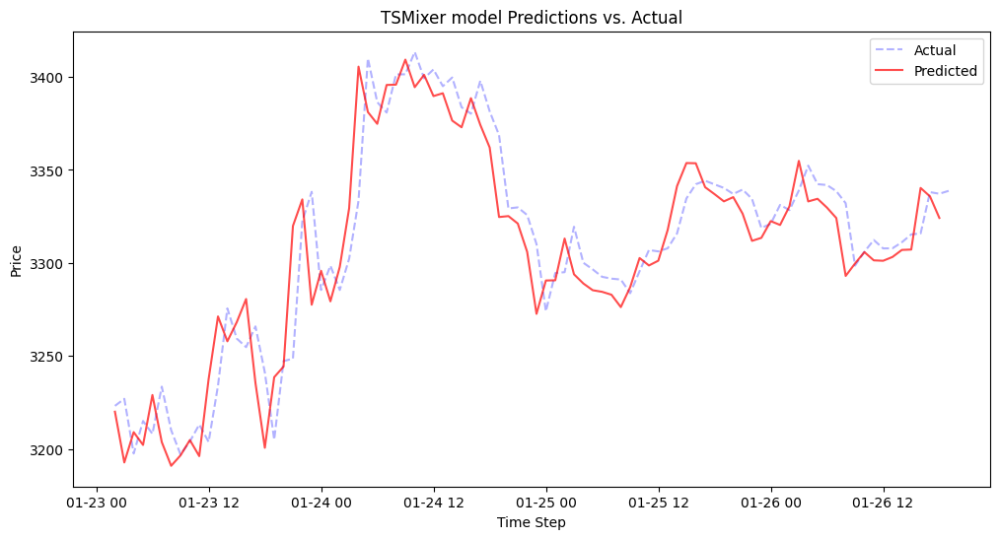

In [96]:
from utils.plots import plot

all_predictions = bt_best_params_test_data['TSMixerPredictions']
all_targets = bt_best_params_test_data['Close']
plot(all_predictions[-90:], all_targets[-90:], "TSMixer model Predictions vs. Actual")

In [97]:
class TechAnalysisWithTSMixerFilterStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.tsmixer_prediction = self.I(lambda: self.data.TSMixerPredictions)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]
        predicted_close_price = self.tsmixer_prediction[-1]

        if current_signal == 1 and self.data.Close[-1] < predicted_close_price:
            self.position.close()
            self.buy()

        elif current_signal == -1 and self.data.Close[-1] > predicted_close_price:
            self.position.close()
            self.sell()

        self.previous_signal = current_signal

In [98]:
bt_best_params_test_data

,Open,High,Low,Close,Volume,Signal,TSMixerPredictions
Datetime,,,,,,,
2024-01-26 19:00:00,2266.80,2267.09,2251.07,2258.51,14671.9075,0,2253.098145
2024-01-26 20:00:00,2258.51,2262.69,2252.49,2258.60,11646.5910,0,2254.579102
2024-01-26 21:00:00,2258.60,2260.87,2253.00,2259.87,6455.0093,0,2263.436523
2024-01-26 22:00:00,2259.86,2272.00,2258.01,2268.01,6966.3637,0,2263.090820
2024-01-26 23:00:00,2268.01,2270.27,2263.99,2267.68,7176.1758,0,2284.738281
...,...,...,...,...,...,...,...
2025-01-26 15:00:00,3311.09,3320.68,3308.74,3315.31,7303.5872,0,3307.168457
2025-01-26 16:00:00,3315.31,3320.00,3307.96,3315.82,6878.4304,0,3340.277832
2025-01-26 17:00:00,3315.83,3344.88,3315.36,3338.04,9465.0436,0,3335.740967


In [99]:
_ = run_backtest(bt_best_params_test_data, TechAnalysisWithTSMixerFilterStrategy)

Start                     2024-01-26 19:00:00
End                       2025-01-26 19:00:00
Duration                    366 days 00:00:00
Exposure Time [%]                   79.965851
Equity Final [$]                1950311.10708
Equity Peak [$]                 2392718.16708
Return [%]                          95.031111
Buy & Hold Return [%]               47.829321
Return (Ann.) [%]                   94.322436
Volatility (Ann.) [%]              119.863511
Sharpe Ratio                         0.786915
Sortino Ratio                        2.733866
Calmar Ratio                         2.428464
Max. Drawdown [%]                   -38.84037
Avg. Drawdown [%]                   -2.976815
Max. Drawdown Duration      128 days 15:00:00
Avg. Drawdown Duration        4 days 02:00:00
# Trades                                    6
Win Rate [%]                        66.666667
Best Trade [%]                      30.286297
Worst Trade [%]                     -9.497039
Avg. Trade [%]                    